# Libraries

To create a decision tree model, we will use the following libraries:

In [1]:
#ignore FutureWarning
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

from sklearn.ensemble import RandomForestClassifier
import pandas as pd
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.tree import export_graphviz
from graphviz import Source

from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

import seaborn as sb
import matplotlib.pyplot as plt

#for graphviz
import os
os.environ["PATH"] += os.pathsep + 'C:/Program Files (x86)/Graphviz-10.0.1-win64/bin/'

C:\Users\josha\AppData\Local\Temp\ipykernel_39004\2277692269.py:7: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


# Importing test and train data

From the revised oversampling notebook, we will import the test and train data. the train data has been oversampled to balance the quantity of each emotion.

In [2]:
#importing train and test split
train_set = pd.read_csv('./outputs/train_set_augmented_simplified.csv')
test_set = pd.read_csv('./outputs/test_set_augmented_simplified.csv')

#Split into features and target; x = features, y = target
X_train = train_set.iloc[:, 1:]
y_train = train_set['label']

X_test = test_set.iloc[:, 1:]
y_test = test_set['label']

#combining test and train set for cross validation
x = pd.concat([X_train, X_test])
y = pd.concat([y_train, y_test])

# Random Forest Training

We will first test the model where the number of trees is 10.

In [3]:
#create a decision tree model
forest_clf = RandomForestClassifier(n_estimators=10, random_state=42)


In [4]:
#decision tree training
forest_clf.fit(X_train, y_train)

RandomForestClassifier(n_estimators=10, random_state=42)

In [5]:
#creates a visualization of the random forest tree
feature_names = X_train.columns
labels = forest_clf.classes_

for i in range(len(forest_clf.estimators_)):
    export_graphviz(forest_clf.estimators_[i], out_file='./RF_results/forest_tree.dot', feature_names=feature_names, class_names=labels, rounded=True, filled=True)
    
    

In [6]:
#displays the decision tree model visualization

graph = Source.from_file(".\RF_results\\forest_tree.dot")
graph

# Nature of Decision Tree

Due to the large amount of columns, the decision tree is very large and difficult to interpret once the maximum depth increases in size. However, since it is still a decision tree, it is still possible to interpret the tree and trace the path of the decision tree when a new data point is inputted.

# Testing the Model
We can observe the performance of the model using the confusion matrix and evaluation metrics.

In [7]:

cross_val_score(forest_clf, x, y, cv=5, scoring='accuracy')



array([0.70877447, 0.71196519, 0.72211748, 0.71380911, 0.69930374])

In [8]:
y_emotion_predict = cross_val_predict(forest_clf, X_train, y_train, cv=5)

In [9]:
cm = confusion_matrix(y_train,y_emotion_predict)
cm

array([[5148,  207,  861,  839],
       [ 373, 5988,  388,  315],
       [1015,  300, 4678, 1058],
       [1317,  253, 1329, 4194]], dtype=int64)

In [10]:
#accuracy score
acs = accuracy_score(y_train,y_emotion_predict)

#precision score
#precision should be very high to avoid false positives
ps =precision_score(y_train,y_emotion_predict, average = "macro")
#recall score
rs = recall_score(y_train, y_emotion_predict, pos_label='e',average='macro')
#f1 score
fs =f1_score(y_train, y_emotion_predict, pos_label='e', average='macro')

print("Accuracy Score: ", acs)
print("Precision Score: ", ps)
print("Recall Score: ", rs)
print("F1 Score: ", fs)

Accuracy Score:  0.7079220181863214
Precision Score:  0.7105815590123807
Recall Score:  0.7080281994909606
F1 Score:  0.7082582484635793


In [11]:
#Test set
test_pred = forest_clf.predict(X_test)
cm = confusion_matrix(y_test,test_pred)
cm

array([[1204,   47,  192,  211],
       [  88, 1518,  101,   70],
       [ 203,   95,  875,  206],
       [ 258,   69,  248,  825]], dtype=int64)

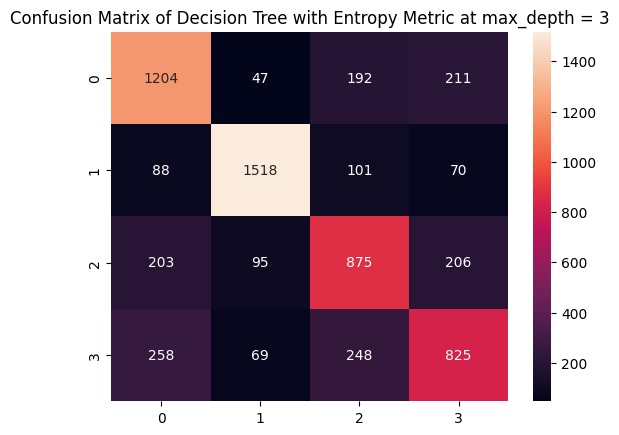

In [12]:
cmg = sb.heatmap(cm, annot=True, fmt='g')
plt.title("Confusion Matrix of Decision Tree with Entropy Metric at max_depth = 3")
plt.savefig('heatmap.png', dpi=300, bbox_inches='tight')

In [13]:
acs_test = accuracy_score(y_test,test_pred)
ps_test = precision_score(y_test,test_pred, average = "macro")
rs_test = recall_score(y_test,test_pred,  average = "macro")
fs_test = f1_score(y_test,test_pred,  average = "macro")

print("Accuracy Score: ", acs_test)
print("Precision Score: ", ps_test)
print("Recall Score: ", rs_test)
print("F1 Score: ", fs_test)

Accuracy Score:  0.7120772946859903
Precision Score:  0.7028838899212788
Recall Score:  0.7014961249932565
F1 Score:  0.7018123504893681


# Graphical Method for finding the best value of n_estimators

In [15]:
n_estimators = range(100, 501, 50)
acc_test = []
acc_train = []
prec_test = []
prec_train = []
rec_test = []
rec_train = []
f1_test = []
f1_train = []

for i in n_estimators:
    forest_clf = RandomForestClassifier(n_estimators=i, random_state=42)
    forest_clf.fit(X_train,y_train)
    y_emotion_predict = cross_val_predict(forest_clf, X_train, y_train, cv=3)
    #append to each list
    acc_train.append(accuracy_score(y_train,y_emotion_predict))
    prec_train.append(precision_score(y_train,y_emotion_predict, average = "macro"))
    rec_train.append(recall_score(y_train, y_emotion_predict,  average='macro'))
    f1_train.append(f1_score(y_train, y_emotion_predict,  average='macro'))
    test_pred = forest_clf.predict(X_test)
    f1_test.append(f1_score(y_test,test_pred, average = "macro"))
    acc_test.append(accuracy_score(y_test,test_pred))
    prec_test.append(precision_score(y_test,test_pred, average = "macro"))
    rec_test.append(recall_score(y_test,test_pred,  average='macro'))
    print('Done: ', i)

Done:  100
Done:  150
Done:  200


KeyboardInterrupt: 

# Comparison of Decision Tree Models

The graphs below show the performance of the decision tree models with different max_depth values.

In [ ]:
#plotting the accuracy, precision, recall and f1 score of test set

plt.plot(n_estimators, acc_test, label = 'Test Accuracy', color = 'red')
plt.plot(n_estimators, prec_test, label = 'Test Precision', color = 'green')
plt.plot(n_estimators, rec_test, label = 'Test Recall', color = 'blue')
plt.plot(n_estimators, f1_test, label = 'Test F1 Score', color = 'orange') 

plt.xlabel('Max Depth')
plt.ylabel('Score')
plt.title('Test Set Scores')
plt.legend()
plt.savefig('forest_test_scores_ov2.png', dpi=300, bbox_inches='tight')
plt.show()

#plotting the accuracy, precision, recall and f1 score of train set

plt.plot(n_estimators, acc_train, label = 'Train Accuracy', color = 'red')
plt.plot(n_estimators, prec_train, label = 'Train Precision', color = 'green')
plt.plot(n_estimators, rec_train, label = 'Train Recall', color = 'blue')
plt.plot(n_estimators, f1_train, label = 'Train F1 Score', color = 'orange')

plt.xlabel('Max Depth')
plt.ylabel('Score')
plt.title('Train Set Scores')
plt.legend()
plt.savefig('forest_train_scores_ov2.png', dpi=300, bbox_inches='tight')
plt.show()

# Selecting the best model

The criteria best model is the one with the highest F1 score.

In [ ]:
#get the depth of the tree with the highest F1 score using index

best_depth = n_estimators[f1_test.index(max(f1_test))]
best_depth

# Rerunning the model with the best max_depth value

We will rerun the model with the best max_depth value to observe the performance of the model.

In [ ]:
#rerun the model with the best depth

forest_clf = RandomForestClassifier(n_estimators=best_depth, random_state=42)

forest_clf.fit(X_train,y_train)

test_pred = forest_clf.predict(X_test)



# Validation of the Model

In [ ]:
# k-fold cross validation

cross_val_score(forest_clf,X_train,y_train, cv=5, scoring="accuracy")

# Evaluation Metrics

In [ ]:
# get the accuracy, precision, recall and f1 score of the best model

acs_test = accuracy_score(y_test,test_pred)
ps_test = precision_score(y_test,test_pred, average = "macro")
rs_test = recall_score(y_test,test_pred,  average = "macro")
fs_test = f1_score(y_test,test_pred,  average = "macro")

print("Accuracy Score: ", "{:.2%}".format(acs_test))
print("Precision Score: ", "{:.2%}".format(ps_test))
print("Recall Score: ", "{:.2%}".format(rs_test))
print("F1 Score: ", "{:.2%}".format(fs_test))

# Confusion matrix

In [ ]:
cm = confusion_matrix(y_test,test_pred)

cmg = sb.heatmap(cm, annot=True, fmt='g')

labels = forest_clf.classes_
cmg.set_xticklabels(labels)
cmg.set_yticklabels(labels)

plt.title("Confusion Matrix of Decision Tree with Entropy Metric at max_depth = " + str(best_depth))

plt.savefig('heatmap_best_depth_ov2.png', dpi=300, bbox_inches='tight')

# Decision Tree Model Visualization

In [ ]:
feature_names = X_train.columns
labels = forest_clf.classes_

for i in range(len(forest_clf.estimators_)):
    export_graphviz(forest_clf.estimators_[i], out_file='./RF_results/Simplified/best_forest_tree_simplified.dot', feature_names=feature_names, class_names=labels, rounded=True, filled=True)
    

graph = Source.from_file("./RF_results/Simplified/best_forest_tree_simplified.dot")
graph.render(filename='best_forest_tree_simplified', format='pdf')
graph

In [ ]:
#joblib for saving the model
from joblib import dump
import numpy as np

dump(forest_clf, './RF_results/Simplified/forest_clf_simplified.joblib')


In [ ]:
#load model
import numpy as np
from joblib import load


forest_clf = load('./RF_results/Simplified/forest_clf_simplified.joblib')

In [ ]:
left_eyebrow = [70,63,105,66,107,55,65,52,53,46]
right_eyebrow = [300,293,334,296,336,285,295,282,283,276]
left_eye = [33,246,161,160,159,158,157,173,133,155,154,153,145,144,163,7]
right_eye =  [263,466,388,387,386,385,384,398,362,382,381,380,374,373,390,249]
inner_lip = [78,191,80,81,82,13,312,311,310,415,308,324,318,402,317,14,87,178,88,95]
outer_lip =  [61,185,40,39,37,0,267,269,270,409,291,375,321,405,314,17,84,181,91,146]
face_boundary = [10,338,297,332,284,251,389,356,454,323,361,288,397,365,379,378,400,377,152,148,176,149,150,136,172,58,132,93,234,127,162,21,54,103,67,109]
left_iris = [468,469,470,471,472]
right_iris = [473,474,475,476,477]
nose = [64,4,294]

combined_points = []
combined_points.extend(left_eyebrow)
combined_points.extend(right_eyebrow)
combined_points.extend(left_eye)
combined_points.extend(right_eye)
combined_points.extend(inner_lip)
combined_points.extend(outer_lip)
combined_points.extend(face_boundary)
combined_points.extend(left_iris)
combined_points.extend(right_iris)
combined_points.extend(nose)

combined_points

#obtain the landmarks that were used in the model
import numpy as np

importances = tree_clf.feature_importances_
indices = np.argsort(importances)[::-1]

# Print the feature ranking according to each emotion
print("Feature ranking:")
for f in range(X_train.shape[1]):
    print(f'Name: {X_train.columns[indices[f]]}, Index: {indices[f]}, Importance: {importances[indices[f]]}')
    
    
#store the features where importance is not 0
top_features = []

#obtain the 90th percentile of features comparing their importances
for f in range(X_train.shape[1]):
    if importances[indices[f]] > np.percentile(importances, 95):
        top_features.append(X_train.columns[indices[f]])
#turn the top 20 landmarks into a list of integers

top = []

for i in top_features:
    top.append(int(i.split('_')[1]))
    
#remove duplicates in top
top = list(dict.fromkeys(top))
#remove from top if not in combined_points
top = [x for x in top if x in combined_points]
top
    


    

In [ ]:
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision
from drawing_utils import draw_landmarks
from drawing_utils import DrawingSpec
from mediapipe.framework.formats import landmark_pb2
import matplotlib.pyplot as plt
#import drawings

def draw_landmarks_on_image(rgb_image, detection_result, landmarks_list):
  face_landmarks_list = detection_result.face_landmarks
  annotated_image = np.copy(rgb_image)

  # Loop through the detected faces to visualize.
  for idx in range(len(face_landmarks_list)):
    face_landmarks = face_landmarks_list[idx]

    # Draw the face landmarks.
    face_landmarks_proto = landmark_pb2.NormalizedLandmarkList()
    face_landmarks_proto.landmark.extend([
      landmark_pb2.NormalizedLandmark(x=landmark.x, y=landmark.y, z=landmark.z) for landmark in face_landmarks
    ])

    draw_landmarks(
        image=annotated_image,
        ImportantLandmarks=landmarks_list,
        landmark_list=face_landmarks_proto,
        connections=mp.solutions.face_mesh.FACEMESH_TESSELATION,
        landmark_drawing_spec = DrawingSpec(color=(0, 0, 0), thickness=4, circle_radius=5),
        connection_drawing_spec=mp.solutions.drawing_styles
        .get_default_face_mesh_tesselation_style())
    draw_landmarks(
        image=annotated_image,
        ImportantLandmarks=landmarks_list,
        landmark_list=face_landmarks_proto,
        connections=mp.solutions.face_mesh.FACEMESH_CONTOURS,
        landmark_drawing_spec=DrawingSpec(color=(0, 0, 0), thickness=4, circle_radius=5),
        connection_drawing_spec=mp.solutions.drawing_styles
        .get_default_face_mesh_contours_style())
    draw_landmarks(
        image=annotated_image,
        ImportantLandmarks=landmarks_list,
        landmark_list=face_landmarks_proto,
        connections=mp.solutions.face_mesh.FACEMESH_IRISES,
          landmark_drawing_spec=DrawingSpec(color=(0, 0, 0), thickness=4, circle_radius=5),
          connection_drawing_spec=mp.solutions.drawing_styles
          .get_default_face_mesh_iris_connections_style())

  return annotated_image

def plot_face_blendshapes_bar_graph(face_blendshapes):
  # Extract the face blendshapes category names and scores.
  face_blendshapes_names = [face_blendshapes_category.category_name for face_blendshapes_category in face_blendshapes]
  face_blendshapes_scores = [face_blendshapes_category.score for face_blendshapes_category in face_blendshapes]
  # The blendshapes are ordered in decreasing score value.
  face_blendshapes_ranks = range(len(face_blendshapes_names))

  fig, ax = plt.subplots(figsize=(12, 12))
  bar = ax.barh(face_blendshapes_ranks, face_blendshapes_scores, label=[str(x) for x in face_blendshapes_ranks])
  ax.set_yticks(face_blendshapes_ranks, face_blendshapes_names)
  ax.invert_yaxis()

  # Label each bar with values
  for score, patch in zip(face_blendshapes_scores, bar.patches):
    plt.text(patch.get_x() + patch.get_width(), patch.get_y(), f"{score:.4f}", va="top")

  ax.set_xlabel('Score')
  ax.set_title("Face Blendshapes")
  plt.tight_layout()
  plt.show()

In [ ]:
#Model Setup
BaseOptions = mp.tasks.BaseOptions
FaceLandmarker = mp.tasks.vision.FaceLandmarker
FaceLandmarkerOptions = mp.tasks.vision.FaceLandmarkerOptions
VisionRunningMode = mp.tasks.vision.RunningMode

base_options = python.BaseOptions(model_asset_path='face_landmarker_v2_with_blendshapes.task')
options = vision.FaceLandmarkerOptions(base_options=base_options,
                                       output_face_blendshapes=True,
                                       output_facial_transformation_matrixes=True,
                                       num_faces=1)

#Test the model
detector2 = vision.FaceLandmarker.create_from_options(options)               
image = mp.Image.create_from_file("../test.jpg")
detection_result = detector2.detect(image) #this is the line

annotated_image = draw_landmarks_on_image(image.numpy_view(), detection_result, top)
print(detection_result)

#annotated image
plt.figure(figsize=(60, 60))
plt.imshow(annotated_image)
plt.title(f'Reference of landmarks that were used in the Decision Tree (95th percentile in terms of importance)', fontsize=60)
#title size

plt.axis('off')